# Style transfer of Gatys et al.

In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
from collections import OrderedDict

# opencv
import cv2

# PIL
import PIL

# torchvision
import torchvision.transforms as transforms

# torch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [2]:
assert torch.cuda.is_available()
device = "cuda"

# Load Content / Style Image

In [3]:
style_image_path = "./data/starry_night.jpg"
content_image_path = "./data/tubingen.jpg"

In [4]:
# Resize the images to have the same size.
RESIZING_RATIO = 1

content_image_pil = PIL.Image.open(content_image_path).convert("RGB")
style_image_pil   = PIL.Image.open(style_image_path).convert("RGB")

content_ratio = content_image_pil.size[1] / content_image_pil.size[0]
style_ratio = style_image_pil.size[1] / style_image_pil.size[0]

print(f"[*] Content image size ratio: {content_ratio:.3f}")
print(f"[*] Style image size ratio: {style_ratio:.3f}")
# assert abs(content_ratio - style_ratio) < 1e-3

resizing_size = (min(content_image_pil.size[1], style_image_pil.size[1]) // RESIZING_RATIO, min(content_image_pil.size[0], style_image_pil.size[0]) // RESIZING_RATIO)
print(f"[*] Resize to {resizing_size}")

[*] Content image size ratio: 0.750
[*] Style image size ratio: 0.792
[*] Resize to (768, 1024)


In [5]:
transform = transforms.Compose([
    transforms.Resize(resizing_size),
    transforms.ToTensor(),
])

def image_loader(filepath):
    image = PIL.Image.open(filepath).convert("RGB")
    image = transform(image).unsqueeze(0)
    return image.to(device, torch.float)

content_img = image_loader(content_image_path)
style_img = image_loader(style_image_path)

# Save and Draw Images

In [6]:
def save_image(tensor, filename):
    os.makedirs("./outputs/", exist_ok=True)
    output_path = f"./outputs/{filename}"
    img = tensor.cpu().clone().squeeze(0).clamp(0, 1)
    img = transforms.functional.to_pil_image(img)
    img.save(output_path)
    return img

content_image_pil = save_image(content_img, filename="content.png")
style_image_pil = save_image(style_img, filename="style.png")

def save_and_draw_images(it, generated_img):
    generated_image_pil = save_image(generated_img, filename=f"{it}.png")

    plt.figure(figsize=(20, 60))

    plt.subplot(1, 3, 1)
    plt.title("Content image")
    plt.imshow(content_image_pil)

    plt.subplot(1, 3, 2)
    plt.title("Style image")
    plt.imshow(style_image_pil)

    plt.subplot(1, 3, 3)
    plt.title("Generated image")
    plt.imshow(generated_image_pil)

    plt.show()

# Gram Matrix

In [7]:
def gram_matrix(features):
    N, C, H, W = features.shape
    features_flat = features.view(N * C, -1)
    gm = torch.mm(features_flat, features_flat.t())
    return gm.div(2 * (N*C*H*W))

# Loss Functions

In [8]:
class ContentLoss(nn.Module):
    def __init__(self, target_feature):
        super().__init__()
        self.target_feature = target_feature.detach()

    def forward(self, x):
        self.loss = F.mse_loss(x, self.target_feature)
        return x


class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super().__init__()
        self.target_gm = gram_matrix(target_feature).detach()

    def forward(self, x):
        gm = gram_matrix(x)
        self.loss = F.mse_loss(gm, self.target_gm)
        return x

# Image Normalization

In [9]:
MEAN = (0.485, 0.456, 0.406)
STD  = (0.229, 0.224, 0.225)

class ImageNormalization(nn.Module):
    def __init__(self, mean, std):
        super().__init__()
        self.mean = torch.Tensor(mean).to(device).view(-1, 1, 1)
        self.std = torch.Tensor(std).to(device).view(-1, 1, 1)
    
    def forward(self, img):
        # return 255*((img - self.mean) / self.std)
        return (255*((img - self.mean) / self.std)).flip(dims=(1,))
        # return 255*(img.flip(dims=(1,)) - self.mean) / self.std

# Load Model & Attach Losses

In [10]:
pretrained_model = nn.Sequential(OrderedDict([
        ("conv1_1", nn.Conv2d(3, 64, kernel_size=3, padding=1)),
        ("relu1_1", nn.ReLU(inplace=False)),
        ("conv1_2", nn.Conv2d(64, 64, kernel_size=3, padding=1)),
        ("relu1_2", nn.ReLU(inplace=False)),
        ("pool1", nn.MaxPool2d(kernel_size=2, stride=2)),

        ("conv2_1", nn.Conv2d(64, 128, kernel_size=3, padding=1)),
        ("relu2_1", nn.ReLU(inplace=False)),
        ("conv2_2", nn.Conv2d(128, 128, kernel_size=3, padding=1)),
        ("relu2_2", nn.ReLU(inplace=False)),
        ("pool2", nn.MaxPool2d(kernel_size=2, stride=2)),

        ("conv3_1", nn.Conv2d(128, 256, kernel_size=3, padding=1)),
        ("relu3_1", nn.ReLU(inplace=False)),
        ("conv3_2", nn.Conv2d(256, 256, kernel_size=3, padding=1)),
        ("relu3_2", nn.ReLU(inplace=False)),
        ("conv3_3", nn.Conv2d(256, 256, kernel_size=3, padding=1)),
        ("relu3_3", nn.ReLU(inplace=False)),
        ("conv3_4", nn.Conv2d(256, 256, kernel_size=3, padding=1)),
        ("relu3_4", nn.ReLU(inplace=False)),
        ("pool3", nn.MaxPool2d(kernel_size=2, stride=2)),

        ("conv4_1", nn.Conv2d(256, 512, kernel_size=3, padding=1)),
        ("relu4_1", nn.ReLU(inplace=False)),
        ("conv4_2", nn.Conv2d(512, 512, kernel_size=3, padding=1)),
        ("relu4_2", nn.ReLU(inplace=False)),
        ("conv4_3", nn.Conv2d(512, 512, kernel_size=3, padding=1)),
        ("relu4_3", nn.ReLU(inplace=False)),
        ("conv4_4", nn.Conv2d(512, 512, kernel_size=3, padding=1)),
        ("relu4_4", nn.ReLU(inplace=False)),
        ("pool4", nn.MaxPool2d(kernel_size=2, stride=2)),

        ("conv5_1", nn.Conv2d(512, 512, kernel_size=3, padding=1)),
        ("relu5_1", nn.ReLU(inplace=False)),
        ("conv5_2", nn.Conv2d(512, 512, kernel_size=3, padding=1)),
        ("relu5_2", nn.ReLU(inplace=False)),
        ("conv5_3", nn.Conv2d(512, 512, kernel_size=3, padding=1)),
        ("relu5_3", nn.ReLU(inplace=False)),
        ("conv5_4", nn.Conv2d(512, 512, kernel_size=3, padding=1)),
        ("relu5_4", nn.ReLU(inplace=False)),
        ("pool5", nn.MaxPool2d(kernel_size=2, stride=2)),
]))

pretrained_model.load_state_dict(torch.load("./data/vgg_conv.pth"))
pretrained_model = pretrained_model.cuda()

In [11]:
def get_model_and_losses(content_loss_layers: str, style_loss_layers: list[str], pooling: str, content_img, style_img):
    assert all(map(lambda x: "conv" in x, content_loss_layers)) and all(map(lambda x: "conv" in x, style_loss_layers))
    content_loss_layers = [layer.replace("conv", "relu") for layer in content_loss_layers]
    style_loss_layers = [layer.replace("conv", "relu") for layer in style_loss_layers]

    model = nn.Sequential(ImageNormalization(mean=MEAN, std=[1, 1, 1]).to(device))
    # model = nn.Sequential(ImageNormalization(mean=MEAN, std=STD).to(device))

    content_loss_modules = []
    style_loss_modules = []
    a, b = 1, 1
    for layer in pretrained_model.children():
        if isinstance(layer, nn.Conv2d):
            name = f"conv{a}_{b}"
        elif isinstance(layer, nn.ReLU):
            name = f"relu{a}_{b}"
            layer = nn.ReLU(inplace=False)
            b += 1
        elif isinstance(layer, nn.MaxPool2d):
            name = f"maxpool{a}"
            a += 1
            b = 1
            if pooling == "max":
                pass
            elif pooling == "avg":
                layer = nn.AvgPool2d(kernel_size=2, stride=2)
            else:
                raise ValueError
        else:
            raise RuntimeError(f"Unrecognized layer: {layer.__class__.__name__}")

        assert name not in model
        model.add_module(name, layer)

        if name in content_loss_layers:
            target_feature = model(content_img).detach()
            content_loss_module = ContentLoss(target_feature)
            model.add_module(f"content_loss_{a}_{b}", content_loss_module)
            content_loss_modules.append(content_loss_module)
        if name in style_loss_layers:
            target_feature = model(style_img).detach()
            style_loss_module = StyleLoss(target_feature)
            model.add_module(f"style_loss_{a}_{b}", style_loss_module)
            style_loss_modules.append(style_loss_module)
    
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break
    model = model[:i+1]

    assert len(content_loss_modules) == len(content_loss_layers) and len(style_loss_modules) == len(style_loss_layers)
    return model, content_loss_modules, style_loss_modules

# Training function

In [12]:
def train(content_losses_from: list[tuple[str, float]], style_losses_from: list[tuple[str, float]],
          opt: str, num_iter: int, show_every: int, learning_rate: float, pooling: str, alpha: float, beta: float, tv_weight: float):
    content_loss_layers, content_loss_weights = list(map(lambda x: x[0], content_losses_from)), list(map(lambda x: x[1], content_losses_from))
    style_loss_layers, style_loss_weights = list(map(lambda x: x[0], style_losses_from)), list(map(lambda x: x[1], style_losses_from))

    content_img.requires_grad_(False)
    style_img.requires_grad_(False)

    # Start from content image
    generated_img = content_img.clone().requires_grad_(True)
    # Start from noise image
    # generated_img = torch.empty_like(content_img).uniform_(0, 1).to(device).requires_grad_(True)

    if opt == "adam":
        optimizer = optim.Adam([generated_img], lr=learning_rate)
    elif opt == "LBFGS":
        optimizer = optim.LBFGS([generated_img], lr=learning_rate)
    else:
        raise ValueError

    model, content_loss_modules, style_loss_modules = get_model_and_losses(content_loss_layers=content_loss_layers, style_loss_layers=style_loss_layers, pooling=pooling,
                                                                           content_img=content_img, style_img=style_img)

    model.requires_grad_(False)

    losses, content_losses, style_losses = [], [], []
    if opt == "adam":
        for it in tqdm(range(num_iter)):
            model(generated_img)

            content_loss = sum(content_loss_weights[i] * content_loss_modules[i].loss for i in range(len(content_loss_weights)))
            style_loss = sum(style_loss_weights[i] * style_loss_modules[i].loss for i in range(len(style_loss_weights)))
            tv_loss = F.mse_loss(generated_img[:, :, :, :-1], generated_img[:, :, :, 1:]) + F.mse_loss(generated_img[:, :, :-1, :], generated_img[:, :, 1:, :])

            loss = (alpha * content_loss) + (beta * style_loss) + (tv_weight * tv_loss)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            losses.append(loss.item())
            content_losses.append(content_loss.item())
            style_losses.append(style_loss.item())

            if it % show_every == 0:
                print(f"[*] {it = }, {loss.item() = }, {content_loss.item() = }, {style_loss.item() = }")
                save_and_draw_images(it=it, generated_img=generated_img)

    elif opt == "LBFGS":
        it = [0]
        while it[0] < num_iter:
            def closure():
                model(generated_img)

                content_loss = sum(content_loss_weights[i] * content_loss_modules[i].loss for i in range(len(content_loss_weights)))
                style_loss = sum(style_loss_weights[i] * style_loss_modules[i].loss for i in range(len(style_loss_weights)))
                tv_loss = F.mse_loss(generated_img[:, :, :, :-1], generated_img[:, :, :, 1:]) + F.mse_loss(generated_img[:, :, :-1, :], generated_img[:, :, 1:, :])

                loss = (alpha * content_loss) + (beta * style_loss) + (tv_weight * tv_loss)

                optimizer.zero_grad()
                loss.backward()

                losses.append(loss.item())
                content_losses.append(content_loss.item())
                style_losses.append(style_loss.item())

                if it[0] % show_every == 0:
                    print(f"[*] {it[0] = }, {loss.item() = }, {content_loss.item() = }, {style_loss.item() = }")
                    save_and_draw_images(it=it[0], generated_img=generated_img)
                it[0] += 1
                return loss

            optimizer.step(closure=closure)

    else:
        raise ValueError

    return losses, style_losses, content_losses

# Process

  0%|          | 0/5000 [00:00<?, ?it/s]

[*] it = 0, loss.item() = 4214115.5, content_loss.item() = 0.0, style_loss.item() = 421.41156005859375


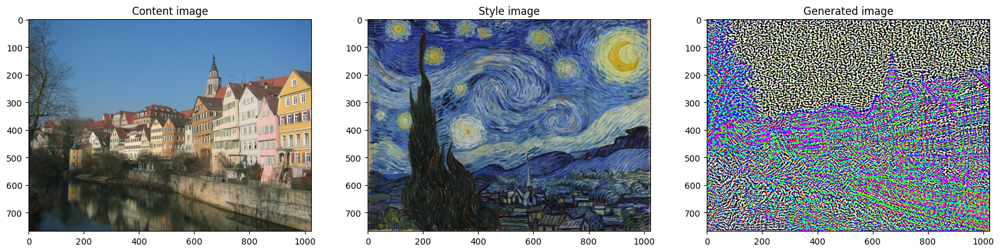

 10%|▉         | 499/5000 [00:18<02:35, 28.89it/s]

[*] it = 500, loss.item() = 162764.4375, content_loss.item() = 78112.546875, style_loss.item() = 8.465188026428223


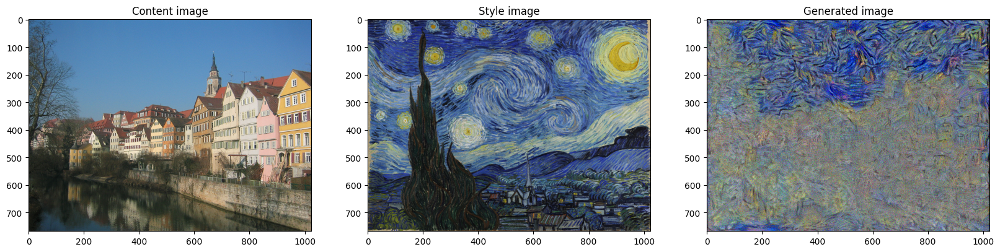

 20%|██        | 1000/5000 [00:36<02:18, 28.88it/s]

[*] it = 1000, loss.item() = 85834.265625, content_loss.item() = 60548.8046875, style_loss.item() = 2.5285463333129883


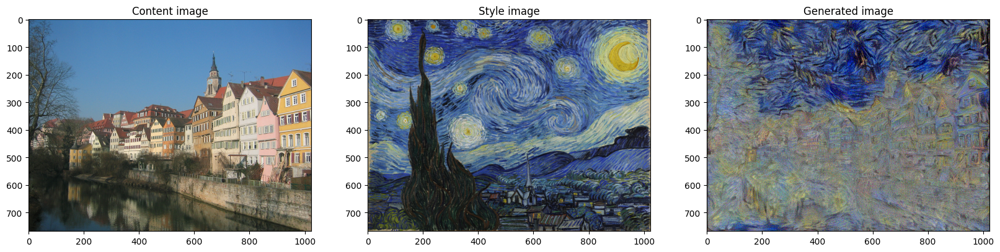

 30%|██▉       | 1498/5000 [00:54<02:02, 28.55it/s]

[*] it = 1500, loss.item() = 64052.828125, content_loss.item() = 51578.46875, style_loss.item() = 1.2474361658096313


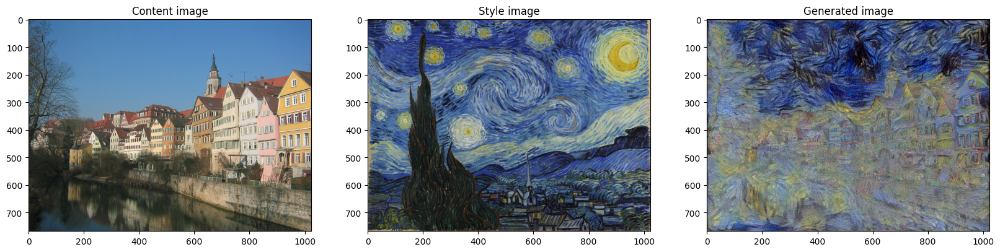

 40%|███▉      | 1999/5000 [01:12<01:47, 27.89it/s]

[*] it = 2000, loss.item() = 54315.34375, content_loss.item() = 46405.65625, style_loss.item() = 0.7909685373306274


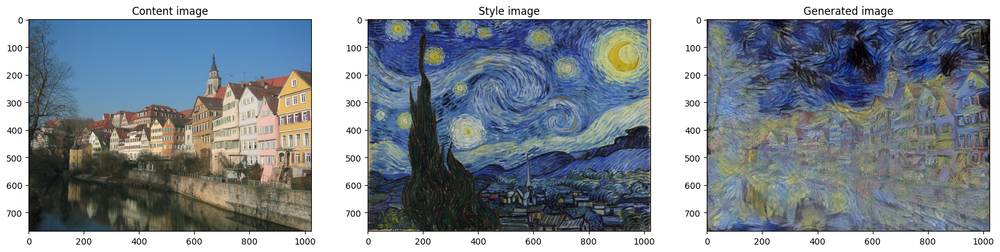

 50%|█████     | 2500/5000 [01:31<01:28, 28.31it/s]

[*] it = 2500, loss.item() = 49354.453125, content_loss.item() = 43099.08984375, style_loss.item() = 0.6255364418029785


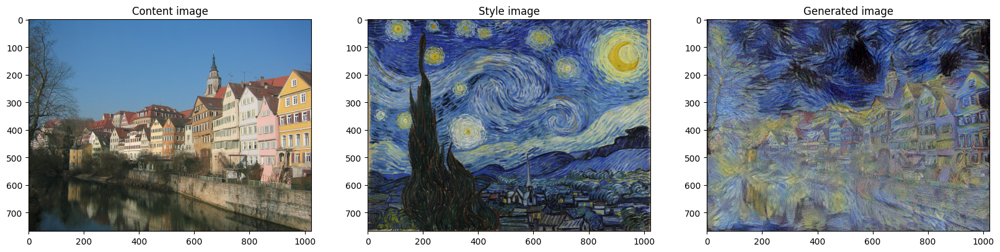

 60%|█████▉    | 2998/5000 [01:49<01:11, 27.99it/s]

[*] it = 3000, loss.item() = 46263.0390625, content_loss.item() = 40761.4296875, style_loss.item() = 0.5501611232757568


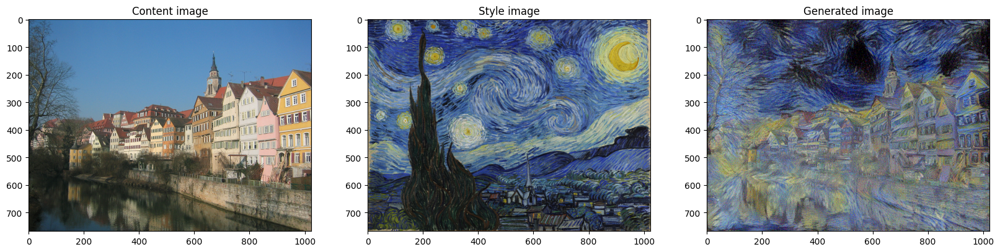

 70%|██████▉   | 3499/5000 [02:07<00:52, 28.48it/s]

[*] it = 3500, loss.item() = 43988.46484375, content_loss.item() = 38978.3671875, style_loss.item() = 0.5010096430778503


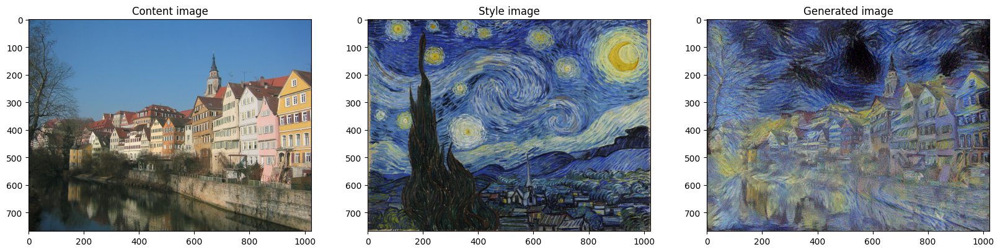

 80%|████████  | 4000/5000 [02:26<00:35, 27.97it/s]

[*] it = 4000, loss.item() = 42196.07421875, content_loss.item() = 37566.375, style_loss.item() = 0.4629698693752289


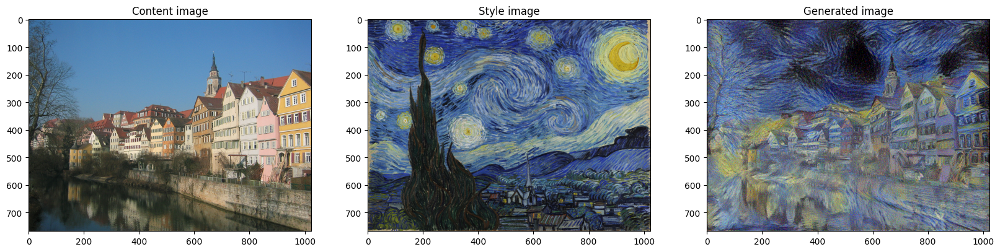

 90%|████████▉ | 4498/5000 [02:44<00:17, 28.59it/s]

[*] it = 4500, loss.item() = 44997.81640625, content_loss.item() = 37327.08984375, style_loss.item() = 0.7670726180076599


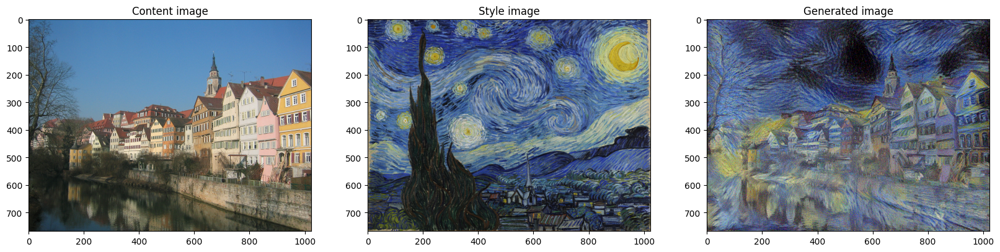

100%|██████████| 5000/5000 [03:02<00:00, 27.37it/s]


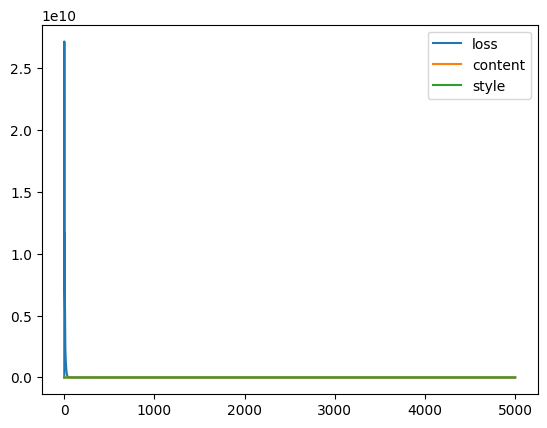

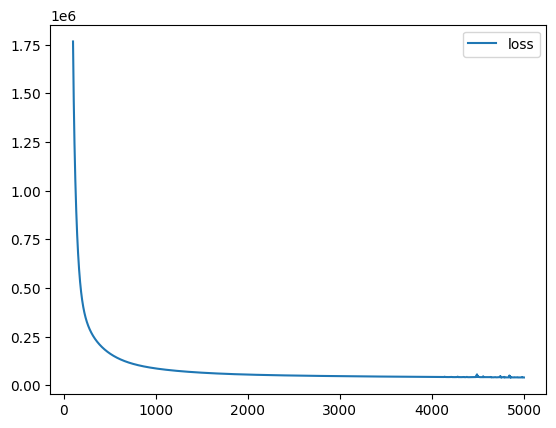

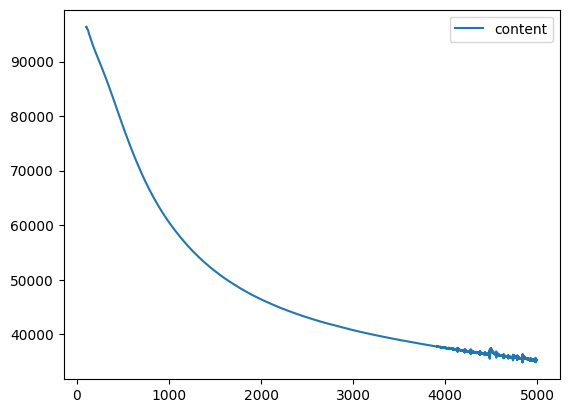

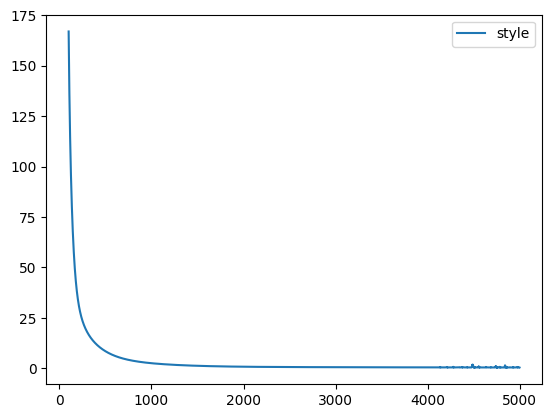

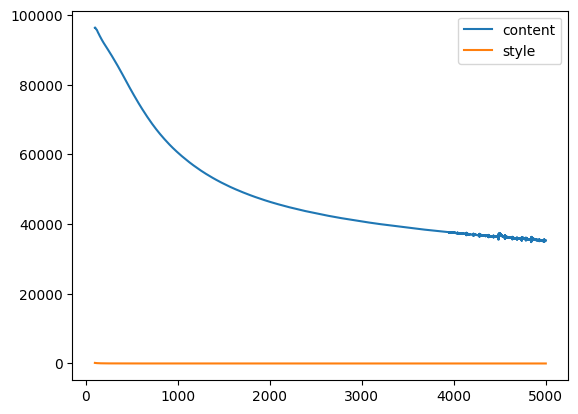

In [13]:
content_losses_from = [
                        ("conv4_2", 1.0),
                      ]

style_losses_from = [
                        ("conv1_1", 0.2),
                        ("conv2_1", 0.2),
                        ("conv3_1", 0.2),
                        ("conv4_1", 0.2),
                        ("conv5_1", 0.2),
                    ]

losses, style_losses, content_losses = train(content_losses_from=content_losses_from, style_losses_from=style_losses_from,
                                             opt="adam", num_iter=5000, show_every=500, learning_rate=1e-0, pooling="avg",
                                             alpha=1, beta=1e4, tv_weight=0)

#################################################
# Plot losses
it = np.arange(len(losses))
plt.plot(it, losses,         label="loss")
plt.plot(it, content_losses, label="content")
plt.plot(it, style_losses,   label="style")
plt.legend(loc="upper right")
# plt.yscale("log")
plt.show()

#################################################
# Plot losses for iterations after 100.
start_point = 100

plt.plot(it[start_point:], losses[start_point:], label="loss")
plt.legend(loc="upper right")
plt.show()

plt.plot(it[start_point:], content_losses[start_point:], label="content")
plt.legend(loc="upper right")
plt.show()

plt.plot(it[start_point:], style_losses[start_point:], label="style")
plt.legend(loc="upper right")
plt.show()

plt.plot(it[start_point:], content_losses[start_point:], label="content")
plt.plot(it[start_point:], style_losses[start_point:], label="style")
plt.legend(loc="upper right")
plt.show()